# Multi scale matching pipeline

## Preparation

### Imports

In [1]:
# Processing
import cv2
import numpy as np
import pywt
import skimage
import SimpleITK as sitk

# Data handling
import tifffile
import os

# Data visualization
import matplotlib.pyplot as plt

### Load images

In [2]:
sample_dir = '../data/Samples_LoD_2/1M01.mrxs/'

images = []
masks = []

i = 0
while os.path.exists(sample_dir + str(i) + '.tiff') and os.path.exists(sample_dir + str(i) + '_mask.tiff'):
    images.append(tifffile.imread(sample_dir + str(i) + '.tiff').astype(np.uint8))
    print(f'Loaded 1M01.mrxs/{i}.tiff')
    masks.append(tifffile.imread(sample_dir + str(i) + '_mask.tiff').astype(np.bool))
    print(f'Loaded 1M01.mrxs/{i}_mask.tiff')
    i += 1

Loaded 1M01.mrxs/0.tiff
Loaded 1M01.mrxs/0_mask.tiff
Loaded 1M01.mrxs/1.tiff
Loaded 1M01.mrxs/1_mask.tiff
Loaded 1M01.mrxs/2.tiff
Loaded 1M01.mrxs/2_mask.tiff


### Parameters

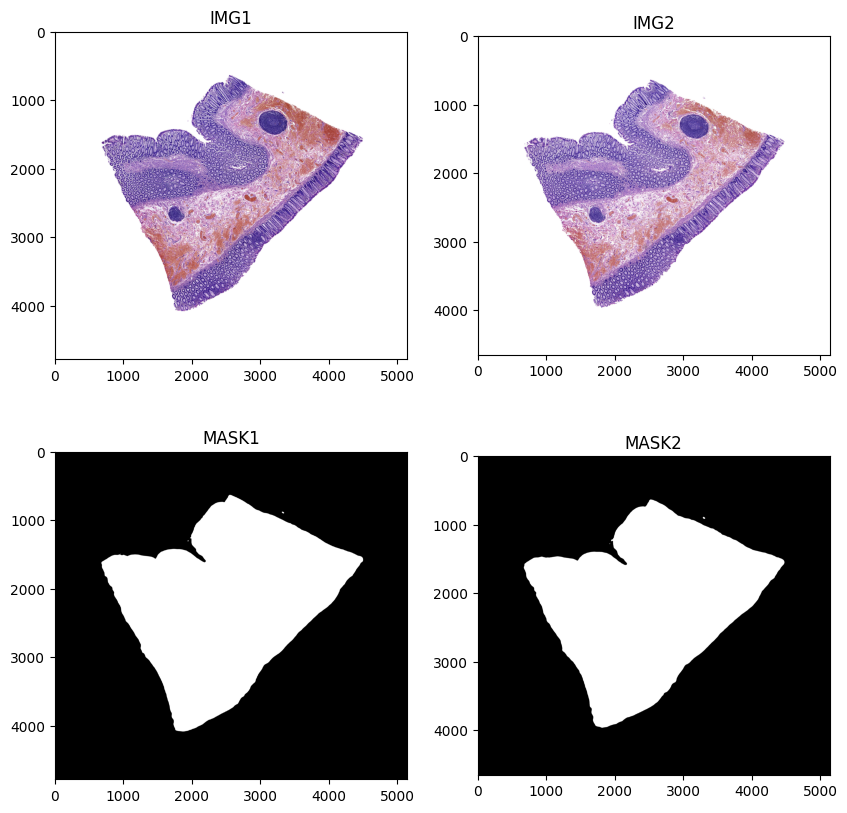

In [3]:
id_1 = 0
id_2 = 1

img1 = images[id_1]
img2 = images[id_2]
mask1 = masks[id_1]
mask2 = masks[id_2]

_, axes = plt.subplots(2,2, figsize=(10, 10))
axes[0,0].imshow(img1)
axes[0,1].imshow(img2)
axes[1,0].imshow(mask1, cmap='gray')
axes[1,1].imshow(mask2, cmap='gray')
axes[0,0].set_title('IMG1')
axes[0,1].set_title('IMG2')
axes[1,0].set_title('MASK1')
axes[1,1].set_title('MASK2')
plt.show() 

### H&D deconvolution

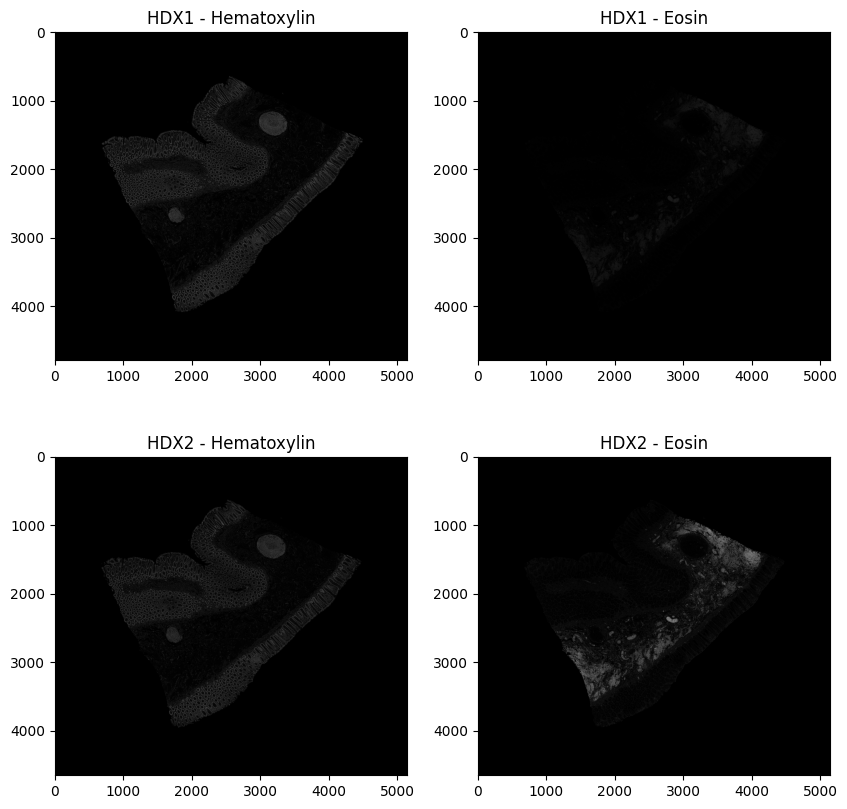

In [4]:
def hdx_split(img: np.ndarray):
    stain_matrix = skimage.color.hdx_from_rgb
    deconvoluted = skimage.color.separate_stains(img, stain_matrix)
    
    return deconvoluted[...,:-1]

hdx1 = hdx_split(img1)
hdx2 = hdx_split(img2)

hem1 = hdx1[:,:,0]
hem2 = hdx2[:,:,0]
eos1 = hdx1[:,:,1]
eos2 = hdx2[:,:,1]

_, axes = plt.subplots(2,2, figsize=(10, 10))
axes[0,0].imshow(hem1, cmap='gray')
axes[0,1].imshow(eos1, cmap='gray')
axes[1,0].imshow(hem2, cmap='gray')
axes[1,1].imshow(eos2, cmap='gray')
axes[0,0].set_title('HDX1 - Hematoxylin')
axes[0,1].set_title('HDX1 - Eosin')
axes[1,0].set_title('HDX2 - Hematoxylin')
axes[1,1].set_title('HDX2 - Eosin')
plt.show()

## Adaptive pyramid using bior6.8 wavlet transform 

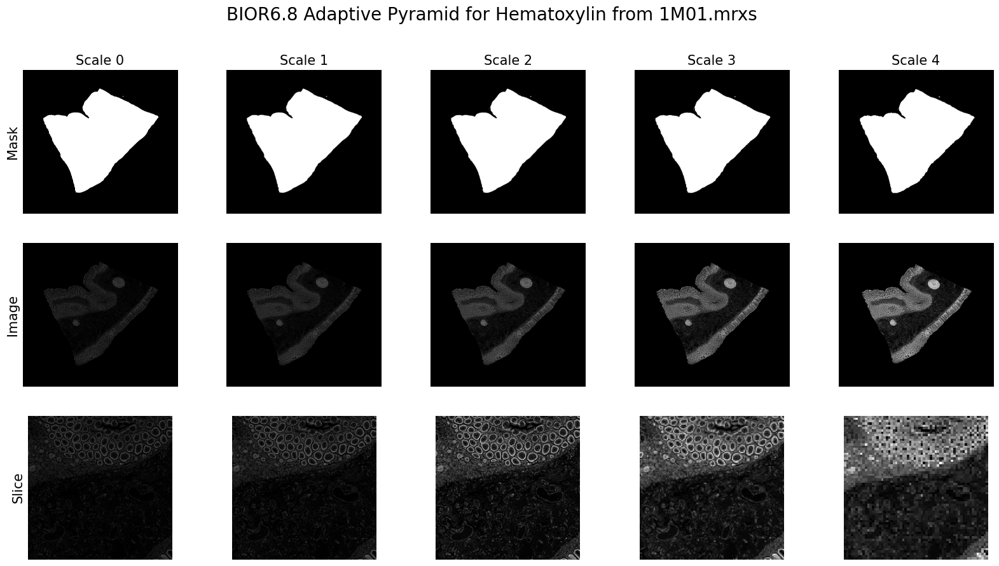

In [5]:
def adaptive_pyramid(image: np.ndarray, mask: np.ndarray, levels: int = 4):
    imgs  = [image]
    masks = [mask.astype(bool)]
    cur_i = image
    cur_m = mask.astype(bool)
    
    for _ in range(levels-1):
        cA, _ = pywt.dwt2(cur_i, 'bior6.8')
        new_m_uint8 = cv2.resize(
            cur_m.astype(np.uint8),
            (cA.shape[1], cA.shape[0]),
            interpolation=cv2.INTER_NEAREST
        )
        new_m = new_m_uint8.astype(bool)

        # Normalize the coefficients to [0, 1]
        cA = (cA - cA.min()) / (cA.max() - cA.min() + 1e-12)
        cA = cA - np.median(cA[~new_m])
        cA = np.clip(cA, 0, 1)
        
        imgs.append(cA)
        masks.append(new_m)
        
        cur_i = cA
        cur_m = new_m

    return imgs, masks

def relative_slice(img: np.ndarray, patch_scale: float = 0.2, patch_width: int = 0.5, patch_height: int = 0.5):
    h, w, = img.shape[:2]
    
    cy, cx = int(h * patch_height), int(w * patch_width)
    patch_size = int(patch_scale * min(h, w) // 2)
    
    slice_img  = img[cy-patch_size:cy+patch_size, cx-patch_size:cx+patch_size]

    return slice_img

def hide_ticks(axes):    
    for ax in axes.flat:
        ax.set_xticks([])
        ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_visible(False)

def grid_plot(images: list[list],
              x_labels: list[str] | None = None,
              y_labels: list[str] | None = None,
              title: str = '',
              figsize: tuple[float,float] = (20, 10),
              cmaps: str | list | None = None):
    n_rows, n_cols = len(images), len(images[0])
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize, squeeze=False)
    fig.suptitle(title, fontsize=20, y=0.98)

    if not isinstance(cmaps, list):
        cmaps = [cmaps] * n_rows
        
    for i in range(n_rows):
        for j in range(n_cols):
            ax = axes[i, j]
            ax.imshow(images[i][j], cmap=cmaps[i])

            if i == 0 and x_labels is not None:
                ax.set_title(x_labels[j], fontsize=15)

            if j == 0 and y_labels is not None:
                ax.set_ylabel(y_labels[i], fontsize=15)
                
    hide_ticks(axes)
    return fig, axes

bior_hem1, bior_mask1 = adaptive_pyramid(hem1, mask1, levels=5)
bior_hem2, bior_mask2 = adaptive_pyramid(hem2, mask2, levels=5)

bior_eos1, _ = adaptive_pyramid(eos1, mask1, levels=5)
bior_eos2, _ = adaptive_pyramid(eos2, mask2, levels=5)

slices = [relative_slice(bior_hem1[i]) for i in range(len(bior_hem1))]

_ = grid_plot(
    [bior_mask1, bior_hem1, slices],
    x_labels=[f'Scale {i}' for i in range(len(bior_hem1))],
    y_labels=['Mask', 'Image', 'Slice'],
    title='BIOR6.8 Adaptive Pyramid for Hematoxylin from 1M01.mrxs',
    cmaps='gray'
)

plt.show()

## Image enchancement

### CLAHE Histogram Equalization

Processing 0
Hematoxylin min/max: 0.0/0.9298304543134652
Eosin min/max: 0.0/1.3287421734044513
Processing 1
Hematoxylin min/max: 0.0/0.9214557296994955
Eosin min/max: 0.0/0.9666571686907146
Processing 2
Hematoxylin min/max: 0.0/0.9199450174495026
Eosin min/max: 0.0/0.9437306083564762
Processing 3
Hematoxylin min/max: 0.0/0.8915668377129757
Eosin min/max: 0.0/0.8806577134713679
Processing 4
Hematoxylin min/max: 0.0/0.9069013088538457
Eosin min/max: 0.0/0.9493141900886749


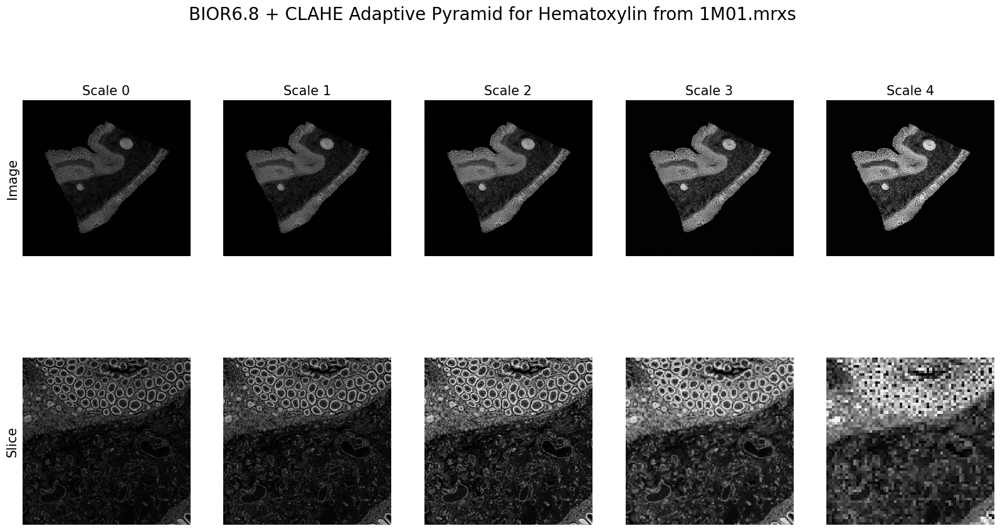

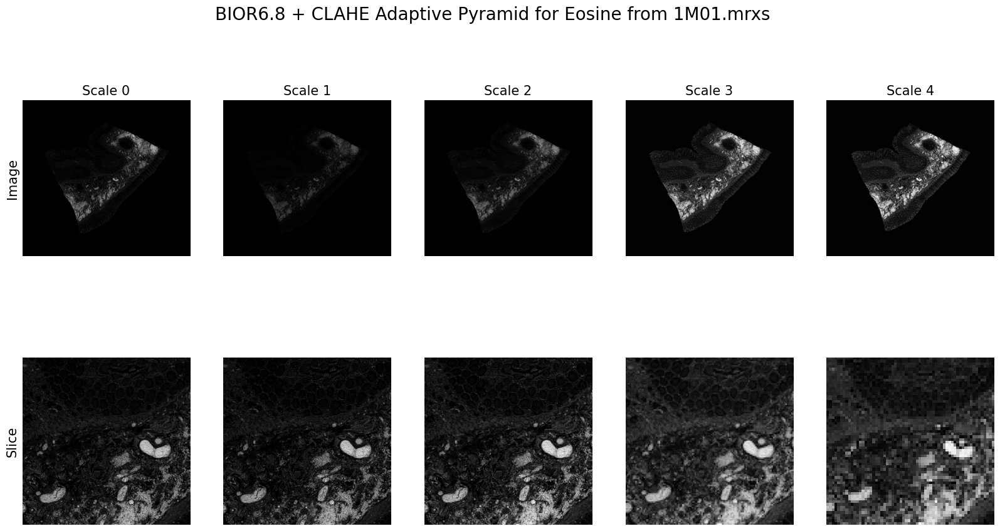

In [6]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(16, 16))

for i in range(len(bior_hem1)):
    print(f'Processing {i}')
    print(f'Hematoxylin min/max: {bior_hem1[i].min()}/{bior_hem1[i].max()}')
    print(f'Eosin min/max: {bior_eos1[i].min()}/{bior_eos1[i].max()}')
    bior_hem1[i] = clahe.apply((bior_hem1[i] * 255).astype(np.uint8))
    bior_hem2[i] = clahe.apply((bior_hem2[i] * 255).astype(np.uint8))
    
    bior_eos1[i] = clahe.apply((bior_eos1[i] * 255).astype(np.uint8))
    bior_eos2[i] = clahe.apply((bior_eos2[i] * 255).astype(np.uint8))
    
slices_hem = [relative_slice(bior_hem1[i]) for i in range(len(bior_hem1))]
slices_eos = [relative_slice(bior_eos1[i]) for i in range(len(bior_eos1))]

_ = grid_plot(
    [bior_hem1, slices_hem],
    x_labels=[f'Scale {i}' for i in range(len(bior_hem1))],
    y_labels=['Image', 'Slice'],
    title='BIOR6.8 + CLAHE Adaptive Pyramid for Hematoxylin from 1M01.mrxs',
    cmaps='gray'
)
plt.show()

_ = grid_plot(
    [bior_eos1, slices_eos],
    x_labels=[f'Scale {i}' for i in range(len(bior_hem1))],
    y_labels=['Image', 'Slice'],
    title='BIOR6.8 + CLAHE Adaptive Pyramid for Eosine from 1M01.mrxs',
    cmaps='gray'
)
plt.show()

### Enchancing nuclei for hematoxylin

In [7]:
def enhance_nuclei(h_channel):
    denoised = cv2.fastNlMeansDenoising(
        h_channel, 
        h=9,
        templateWindowSize=7,
        searchWindowSize=21
    )
    frangi = skimage.filters.frangi(denoised, scale_range=(1, 3))
    frangi_scaled = (255 * (frangi - frangi.min()) / (frangi.max() - frangi.min())).astype(np.uint8)
    return cv2.addWeighted(denoised, 0.5, frangi, 0.5, 0)

#for i in range(len(bior_hem1)):
#    print(f'Processing {i}')
#    bior_hem1[i] = enhance_nuclei(bior_hem1[i])
#    bior_hem2[i] = enhance_nuclei(bior_hem2[i])
#
#slices_hem = [relative_slice(bior_hem1[i]) for i in range(len(bior_hem1))]
#
#_ = grid_plot(
#    [bior_hem1, slices_hem],
#    x_labels=[f'Scale {i}' for i in range(len(bior_hem1))],
#    y_labels=['Image', 'Slice'],
#    title='Nuclei Enhancement for Hematoxylin from 1M01.mrxs',
#    cmaps='gray'
#)

## KAZE Keypoint detection

### KAZE Keypoint visualisation on bior6.8 pyramid

Processing images of size (4782, 5143) and (4649, 5143)
Found 57451 and 50774 keypoints
Processing images of size (2399, 2580) and (2333, 2580)
Found 15465 and 12758 keypoints
Processing images of size (1208, 1298) and (1175, 1298)
Found 3406 and 3488 keypoints
Processing images of size (612, 657) and (596, 657)
Found 753 and 671 keypoints
Processing images of size (314, 337) and (306, 337)
Found 274 and 228 keypoints


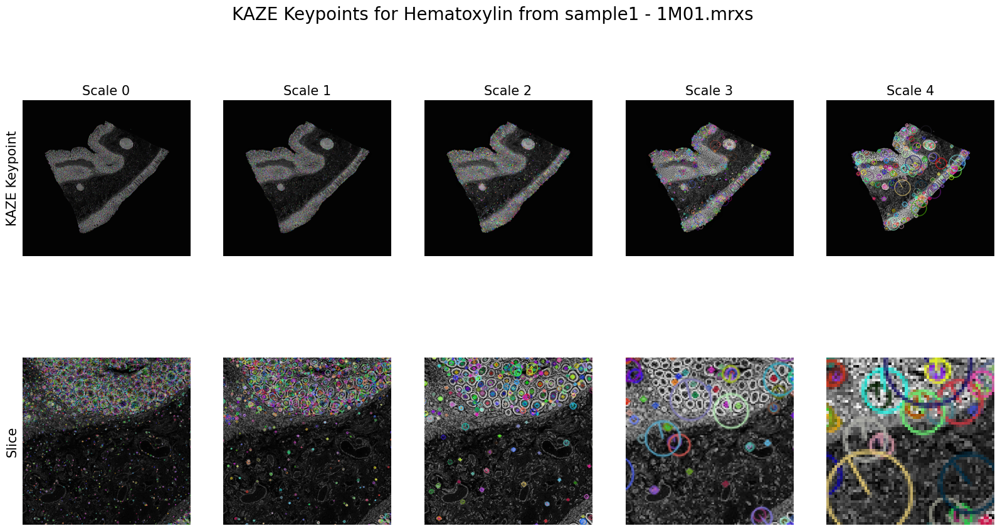

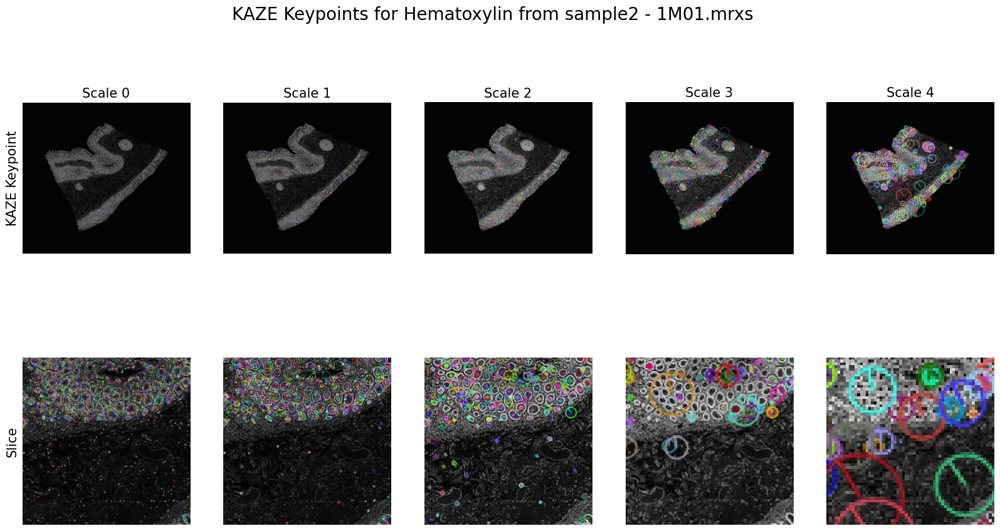

In [8]:
def erode_mask(mask: np.ndarray, kernel_size: int = 3) -> np.ndarray:
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    return cv2.erode(mask.astype(np.uint8), kernel, iterations=1).astype(bool)

kaze = cv2.KAZE_create(upright=False,
    threshold=0.001, 
    nOctaves=4, 
    nOctaveLayers=4,
    diffusivity=cv2.KAZE_DIFF_PM_G2
)

kaze_vis1 = []
kaze_vis2 = []

for ihem1, ihem2, imask1, imask2 in zip(bior_hem1, bior_hem2, bior_mask1, bior_mask2):
    print(f'Processing images of size {ihem1.shape} and {ihem2.shape}')
    kp1, des1 = kaze.detectAndCompute(ihem1, erode_mask(imask1, kernel_size=3).astype(np.uint8))
    kp2, des2 = kaze.detectAndCompute(ihem2, erode_mask(imask2, kernel_size=3).astype(np.uint8))
    print(f'Found {len(kp1)} and {len(kp2)} keypoints')
    
    vis1 = cv2.drawKeypoints(ihem1, kp1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    vis2 = cv2.drawKeypoints(ihem2, kp2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    kaze_vis1.append(vis1)
    kaze_vis2.append(vis2)

slices1 = [relative_slice(kaze_vis1[i]) for i in range(len(kaze_vis1))]
slices2 = [relative_slice(kaze_vis2[i]) for i in range(len(kaze_vis2))]

_ = grid_plot(
    [kaze_vis1, slices1],
    x_labels=[f'Scale {i}' for i in range(len(bior_hem1))],
    y_labels=['KAZE Keypoint', 'Slice'],
    title='KAZE Keypoints for Hematoxylin from sample1 - 1M01.mrxs',
)
plt.show()

_ = grid_plot(
    [kaze_vis2, slices2],
    x_labels=[f'Scale {i}' for i in range(len(bior_hem1))],
    y_labels=['KAZE Keypoint', 'Slice'],
    title='KAZE Keypoints for Hematoxylin from sample2 - 1M01.mrxs',
)
plt.show()

### Keypoints matching

Processing level 2
Found 3257 matches
Matches after Lowe's test: 480
Matches after mutual filtering: 353
Processing level 3
Found 718 matches
Matches after Lowe's test: 255
Matches after mutual filtering: 195
Processing level 2
Found 653 matches
Matches after Lowe's test: 279
Matches after mutual filtering: 225
Processing level 3
Found 665 matches
Matches after Lowe's test: 366
Matches after mutual filtering: 310
Matches after RANSAC: 61


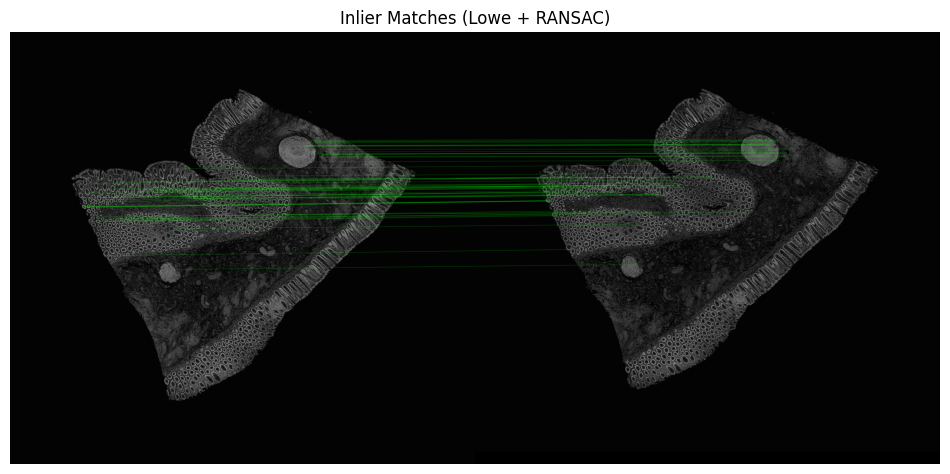

In [9]:
def lowes_test_ratio(matches: list[cv2.DMatch], ratio: float = 0.75) -> list[cv2.DMatch]:
    good_matches = []
    for m, n in matches:
        if m.distance < ratio * n.distance:
            good_matches.append(m)
    return good_matches

def filter_mask(kp: list[cv2.KeyPoint], mask: np.ndarray) -> list[cv2.KeyPoint]:
    filtered_kp = []
    for k in kp:
        if mask[int(k.pt[1]), int(k.pt[0])]:
            filtered_kp.append(k)
    return filtered_kp

def scale_kp(kp: list[cv2.KeyPoint], scale: float) -> list[cv2.KeyPoint]:
    scaled_kp = []
    for k in kp:
        new_k = cv2.KeyPoint(k.pt[0] * scale, k.pt[1] * scale, k.size * scale, k.angle, k.response, k.octave, k.class_id)
        scaled_kp.append(new_k)
    return scaled_kp

def find_scaled(
        feature: cv2.Feature2D, 
        o_img1: np.ndarray, img1: np.ndarray, mask1: np.ndarray, 
        o_img2: np.ndarray, img2: np.ndarray, mask2: np.ndarray, 
        erosion_scale: int = 100
    ):
    
    erosion_s1 = (img1.shape[0] + img1.shape[1]) // erosion_scale
    erosion_s2 = (img2.shape[0] + img2.shape[1]) // erosion_scale
    mask1 = erode_mask(mask1, erosion_s1)
    mask2 = erode_mask(mask2, erosion_s2)
    
    kp1, des1 = kaze.detectAndCompute(img1, mask1.astype(np.uint8))
    kp2, des2 = kaze.detectAndCompute(img2, mask2.astype(np.uint8))
        
    img1_scale = o_img1.shape[0] / img1.shape[0]
    img2_scale = o_img2.shape[0] / img2.shape[0]
    
    kp1 = scale_kp(kp1, img1_scale)
    kp2 = scale_kp(kp2, img2_scale)
    
    return kp1, des1, kp2, des2
    
def merge_matches(match1: list[cv2.DMatch], match2: list[cv2.DMatch], q_offset: int, t_offset: int):
    assert q_offset >= 0 and t_offset >= 0

    adjusted_match2 = [
        cv2.DMatch(m.queryIdx + q_offset, m.trainIdx + t_offset, m.distance)
        for m in match2
    ]

    return match1 + adjusted_match2

def sample_matches(
        matches: list[cv2.DMatch], 
        kp1: list[cv2.KeyPoint], kp2: list[cv2.KeyPoint], 
        des1: list, des2: list,
        weights: np.ndarray[np.float32],
        sample_prc: float = 0.2,
        seed: int = 42
    ):

    assert len(weights) == len(matches)
    
    np.random.seed(seed)
    w_min = weights.min()
    w_max = weights.max()
    w_norm = ((weights - w_min) / (w_max - w_min))
    w_norm = w_norm / w_norm.sum()
    
    indexes = np.arange(len(weights))
    choice = np.random.choice(indexes, size=int(len(weights) * sample_prc), p=w_norm, replace=False)
    
    ret_kp1 = []
    ret_kp2 = []
    ret_des1 = []
    ret_des2 = []
    ret_matches = []
    for i, c in enumerate(choice):
        q_idx = matches[c].queryIdx
        t_idx = matches[c].trainIdx
        
        ret_matches.append(matches[c])
        ret_kp1.append(kp1[q_idx])
        ret_kp2.append(kp2[t_idx])
        ret_des1.append(des1[q_idx])
        ret_des2.append(des2[t_idx])
        ret_matches[i].queryIdx = i
        ret_matches[i].trainIdx = i

    return ret_matches, (ret_kp1, ret_des1), (ret_kp2, ret_des2)
    
def match_find_bior(
        feature: cv2.Feature2D, matcher: cv2.DescriptorMatcher,
        bior1_pyr: list[np.ndarray], bior2_pyr: list[np.ndarray],
        bior1_mask: list[np.ndarray], bior2_mask: list[np.ndarray],
        levels: list[int] = [0],
        erosion_scale: int = 100,
        mutual: bool = False,
        lowes_ratio: float = 0.75,
        weight_function: callable = None,
        sample_prc: float = 0.2,
        random_seed: int = 42
    ):
    
    weights = []
    ret_matches = []
    ret_kp1 = []
    ret_kp2 = []
    ret_des1 = []
    ret_des2 = []
    for l in levels:
        print(f'Processing level {l}')
        kp1, des1, kp2, des2 = find_scaled(
            feature, 
            bior1_pyr[0], bior1_pyr[l], bior1_mask[l], 
            bior2_pyr[0], bior2_pyr[l], bior2_mask[l], 
            erosion_scale=erosion_scale
        )
        
        matches = matcher.knnMatch(des1, des2, k=2)
        print(f'Found {len(matches)} matches')
        good_matches = lowes_test_ratio(matches, ratio=lowes_ratio)
        print(f"Matches after Lowe's test: {len(good_matches)}")
        
        if mutual:
            matches_rev = matcher.knnMatch(des2, des1, k=2)
            good_matches_rev = lowes_test_ratio(matches_rev, ratio=lowes_ratio)
            rev_pairs = set((m_rev.trainIdx, m_rev.queryIdx) for m_rev in good_matches_rev)
            good_matches = [m for m in good_matches if (m.queryIdx, m.trainIdx) in rev_pairs]
            print(f'Matches after mutual filtering: {len(good_matches)}')
        
        loc_weights = None
        if weight_function is not None:
            loc_weights = [weight_function(l, kp1[m.queryIdx].response) for m in good_matches]
            weights.extend(loc_weights)

        ret_matches = merge_matches(ret_matches, good_matches, len(ret_kp1), len(ret_kp2))
        ret_kp1.extend(kp1)
        ret_kp2.extend(kp2)
        ret_des1.extend(des1)
        ret_des2.extend(des2)

    if weight_function is not None:
        return sample_matches(ret_matches, ret_kp1, ret_kp2, ret_des1, ret_des2, np.array(weights), sample_prc, random_seed)

    return ret_matches, (ret_kp1, ret_des1), (ret_kp2, ret_des2)

kaze = cv2.KAZE_create(upright=False,
    threshold=0.001, 
    nOctaves=4, 
    nOctaveLayers=4,
    diffusivity=cv2.KAZE_DIFF_PM_G2
)
matcher = cv2.FlannBasedMatcher({'algorithm':1, 'trees':5} , {'checks':50})
levels = [2, 3]

w_function = lambda l, r: (l + 1) * r / 2

hem_good_matches, (hem_kp1, _), (hem_kp2, _) = match_find_bior(
    kaze, matcher,
    bior_hem1, bior_hem2,
    bior_mask1, bior_mask2, 
    levels=levels,
    erosion_scale=200,
    mutual=True,
    lowes_ratio=0.75,
    weight_function=w_function,
    sample_prc=0.5
)

eos_good_matches, (eos_kp1, _), (eos_kp2, _) = match_find_bior(
    kaze, matcher,
    bior_eos1, bior_eos2,
    bior_mask1, bior_mask2,
    levels=levels,
    erosion_scale=200,
    mutual=True,
    lowes_ratio=0.75,
    weight_function=w_function,
    sample_prc=0.5
)


kp1 = hem_kp1 + eos_kp1
kp2 = hem_kp2 + eos_kp2

good_matches = merge_matches(hem_good_matches, eos_good_matches, len(hem_kp1), len(hem_kp2))

src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

H, mask = cv2.estimateAffinePartial2D(
    src_pts, dst_pts,
    method=cv2.RANSAC, 
    ransacReprojThreshold=4.0,
    refineIters=10
)

inlier_matches = [m for i, m in enumerate(good_matches) if mask[i]]
print(f'Matches after RANSAC: {len(inlier_matches)}')

vis_img1 = np.maximum(bior_hem1[0], bior_eos1[0])
vis_img2 = np.maximum(bior_hem2[0], bior_eos2[0])

matched_img = cv2.drawMatches(
    vis_img1, kp1,
    vis_img2, kp2,
    inlier_matches,
    None,
    matchColor=(0, 255, 0),
    singlePointColor=None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

plt.figure(figsize=(12, 6))
plt.imshow(cv2.cvtColor(matched_img, cv2.COLOR_BGR2RGB))
plt.title('Inlier Matches (Lowe + RANSAC)')
plt.axis('off')
plt.show()

### Matching visualization

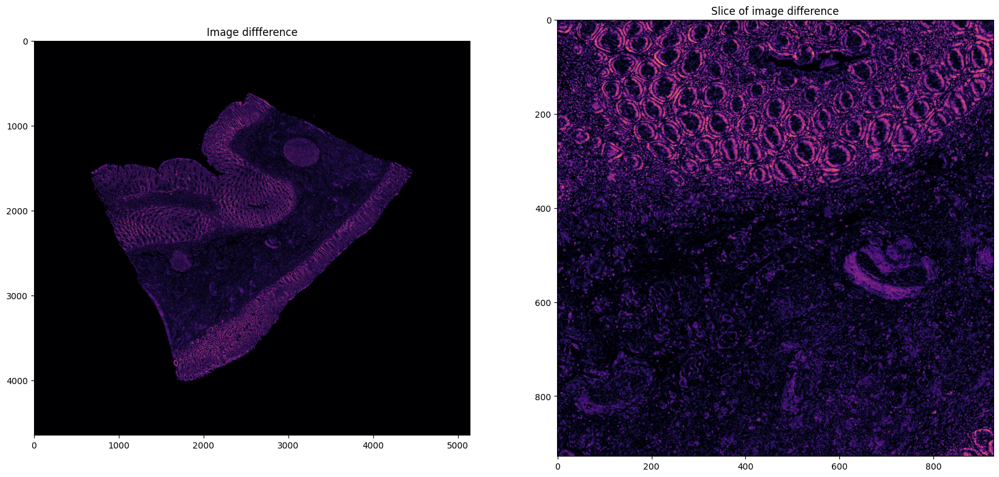

In [10]:
img1 = vis_img1
img2 = vis_img2

img1 = cv2.warpAffine(
    img1, H, (img2.shape[1], img2.shape[0]), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REPLICATE
)

diff = cv2.absdiff(img1, img2)

fig, axes = plt.subplots(1, 2, figsize=(20, 10))
axes[0].imshow(diff, cmap='magma')
axes[0].set_title('Image diffference')
axes[1].imshow(relative_slice(diff), cmap='magma')
axes[1].set_title('Slice of image difference')
plt.show()

## Normalized Gradient Field

### Gradients

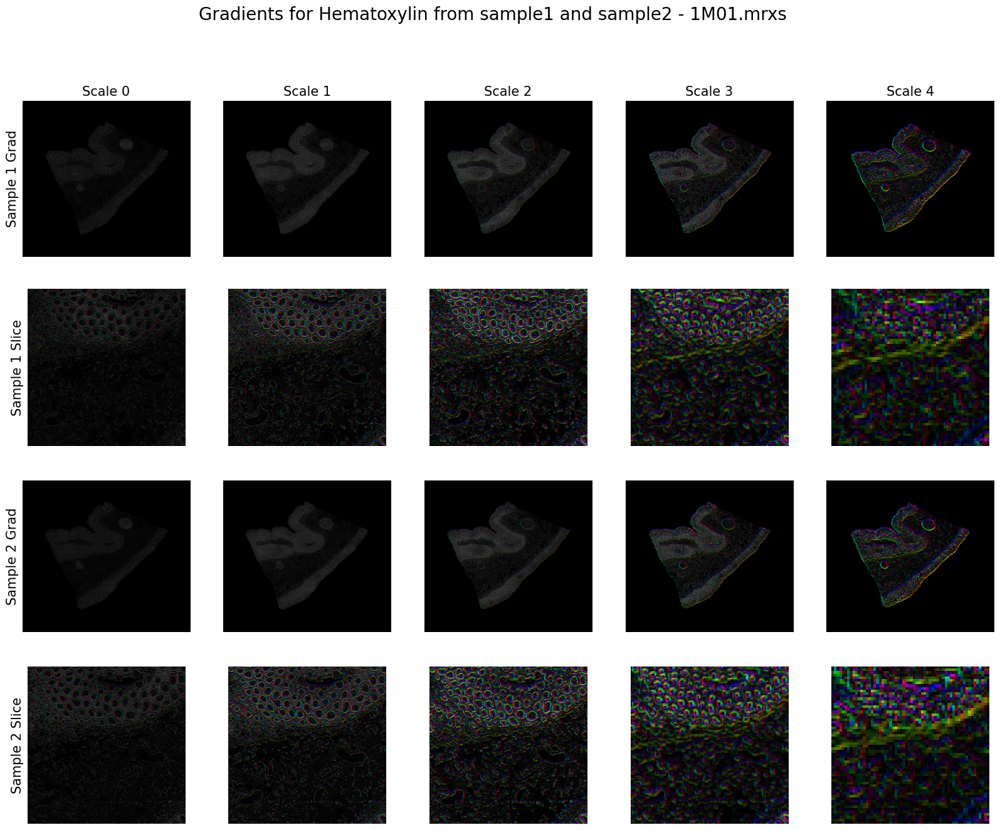

In [11]:
def img_gradient(image: np.ndarray) -> np.ndarray:
    gx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    gy = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)

    return gx, gy

def hsv_gradient(image: np.ndarray, gradient: tuple[np.ndarray, np.ndarray] | None = None, rgb: bool = False) -> np.ndarray:
    gx, gy = None, None
    if gradient is None:
        gx, gy = img_gradient(image)
    else:
        gx, gy = gradient
        
    mg = np.sqrt(gx**2 + gy**2)
    mg_norm = (mg - mg.min()) / (mg.max() - mg.min() + 1e-12)
    angle = (np.arctan2(gy, gx) + np.pi) / (2 * np.pi)
    
    h = (angle * 179).astype(np.uint8)
    s = np.ones_like(h, dtype=np.uint8) * 255
    v = (mg_norm * 255).astype(np.uint8)

    hsv = cv2.merge([h, s, v])

    return hsv if not rgb else cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)

slices1 =  [relative_slice(bior_hem1[i]) for i in range(len(bior_hem1))]
slices2 =  [relative_slice(bior_hem2[i]) for i in range(len(bior_hem2))]

_ = grid_plot(
    [[hsv_gradient(bior_hem1[i], rgb=True) for i in range(len(bior_hem1))],
     [hsv_gradient(slices1[i], rgb=True) for i in range(len(slices1))],
     [hsv_gradient(bior_hem2[i], rgb=True) for i in range(len(bior_hem2))],
     [hsv_gradient(slices2[i], rgb=True) for i in range(len(slices2))]],
    x_labels=[f'Scale {i}' for i in range(len(bior_hem1))],
    y_labels=['Sample 1 Grad', 'Sample 1 Slice', 'Sample 2 Grad', 'Sample 2 Slice'],
    title='Gradients for Hematoxylin from sample1 and sample2 - 1M01.mrxs',
    figsize=(20, 15)
)
plt.show()

### NGF between sample1 and sample2

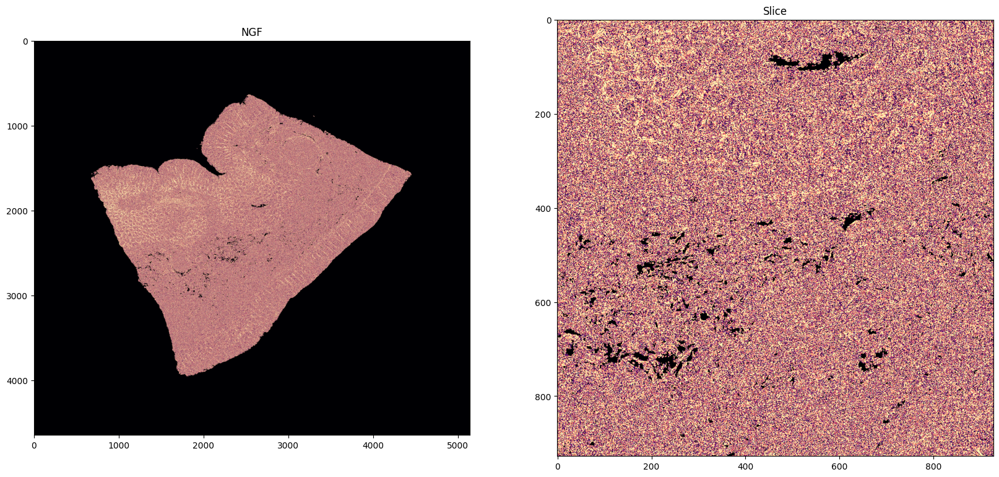

In [12]:
def img_normalized_gradient(image: np.ndarray) -> np.ndarray:
    epsilon = 1e-8
    gx, gy = img_gradient(image)

    mg = np.sqrt(gx**2 + gy**2) + np.finfo(float).eps
    nx = gx / mg
    ny = gy / mg

    return nx, ny

def img_mmi(image1: np.ndarray, image2: np.ndarray):
    eps = np.finfo(float).eps
    
    gx1, gy1 = img_gradient(image1)
    gx2, gy2 = img_gradient(image2)
    
    n1x, n1y = gx1/(np.hypot(gx1,gy1)+eps), gy1/(np.hypot(gx1,gy1)+eps)
    n2x, n2y = gx2/(np.hypot(gx2,gy2)+eps), gy2/(np.hypot(gx2,gy2)+eps)
    
    dot = np.abs(n1x*n2x + n1y*n2y)
    mag2 = np.hypot(gx2, gy2)
    ngf_map = dot * (mag2**2 / (mag2**2 + eps))

    return ngf_map

ngf = img_mmi(img1, img2)

fig, axes = plt.subplots(1, 2, figsize=(20, 10))
axes[0].imshow(ngf, cmap='magma')
axes[0].set_title('NGF')
axes[1].imshow(relative_slice(ngf), cmap='magma')
axes[1].set_title('Slice')
plt.show()

## Non-linear optimalization with B-spline 

### Adaptive pyramid transformation

In [13]:
for i in range(len(bior_hem1)):
    bior_hem1[i] = cv2.warpAffine(
        bior_hem1[i], H, (bior_hem2[i].shape[1], bior_hem2[i].shape[0]), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REPLICATE
    )
    bior_eos1[i] = cv2.warpAffine(
        bior_eos1[i], H, (bior_eos2[i].shape[1], bior_eos2[i].shape[0]), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REPLICATE
    )
    bior_mask1[i] = cv2.warpAffine(
        bior_mask1[i].astype(np.uint8), H, (bior_mask2[i].shape[1], bior_mask2[i].shape[0]), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REPLICATE
    ).astype(bool)

### MMI

In [14]:
# def convert_sitk(
#         hem1: np.ndarray, eos1: np.ndarray,
#         hem2: np.ndarray, eos2: np.ndarray,
#         masks: tuple[np.ndarray, np.ndarray] = None,
#     ) -> tuple[sitk.Image]:
    
#     arr1 = np.stack(
#         [hem1, eos1],
#         axis=-1
#     ).astype(np.float32)
#     arr2 = np.stack(
#         [hem2, eos2],
#         axis=-1
#     ).astype(np.float32)
    
#     mask1 = None
#     mask2 = None
#     if masks is not None:
#         mask1 = masks[0].astype(np.uint8)
#         mask2 = masks[1].astype(np.uint8)
    
#     reference = sitk.GetImageFromArray(arr1, isVector=True)
#     reference.SetSpacing((1.0,) * reference.GetDimension())
#     reference.SetOrigin((0.0,) * reference.GetDimension())
#     img1 = sitk.GetImageFromArray(arr1, isVector=True); img1.CopyInformation(reference)
#     img2 = sitk.GetImageFromArray(arr2, isVector=True); img2.CopyInformation(reference)
#     if masks is not None:
#         mask1 = sitk.GetImageFromArray(mask1); mask1.CopyInformation(reference)
#         mask2 = sitk.GetImageFromArray(mask2); mask2.CopyInformation(reference)
#         return img1, img2, mask1, mask2
#     return img1, img2    

# def combine_channels(img: sitk.Image) -> sitk.Image:
#     assert img.GetNumberOfComponentsPerPixel() == 2
    
#     img1 = sitk.VectorIndexSelectionCast(img, 0)
#     img2 = sitk.VectorIndexSelectionCast(img, 1)
    
#     return sitk.Maximum(img1, img2)

# def high_level_reg(
#         img1: sitk.Image,
#         img2: sitk.Image,
#         mask1: sitk.Image = None,
#         mask2: sitk.Image = None,
#         initial_transform: sitk.Transform = None,
#         grid_control_points: int = 8,
#         mi_bins: int = 32,
#         sampling_percentage: float = 0.1
#     ) -> sitk.Transform:

#     assert img1.GetSize() == img2.GetSize()

#     img1 = combine_channels(img1)
#     img2 = combine_channels(img2)
    
#     if initial_transform is not None:
#         img1 = sitk.Resample(img1, img1, initial_transform, sitk.sitkLinear)
#         img2 = sitk.Resample(img2, img2, initial_transform, sitk.sitkLinear)
    
#     initial_transform = sitk.BSplineTransformInitializer(
#         image1=img1,
#         transformDomainMeshSize=[grid_control_points] * img1.GetDimension(),
#         order=3
#     )

#     reg = sitk.ImageRegistrationMethod()

#     reg.SetMetricAsMattesMutualInformation(mi_bins)
#     reg.SetMetricSamplingStrategy(reg.RANDOM)
#     reg.SetMetricSamplingPercentage(sampling_percentage)

#     if mask1 is not None:
#         reg.SetMetricFixedMask(mask1)
#     if mask2 is not None:
#         reg.SetMetricMovingMask(mask2)

#     reg.SetOptimizerAsLBFGSB(
#         gradientConvergenceTolerance=1e-4,
#         numberOfIterations=50,
#         maximumNumberOfCorrections=5,
#         maximumNumberOfFunctionEvaluations=100
#     )

#     reg.SetShrinkFactorsPerLevel([8, 4, 2, 1])
#     reg.SetSmoothingSigmasPerLevel([8, 4, 2, 0])

#     reg.SetInterpolator(sitk.sitkLinear)

#     reg.SetInitialTransform(initial_transform, inPlace=False)
#     final_transform = reg.Execute(img1, img2)

#     return final_transform

# def low_level_reg(
#         img1: sitk.Image,
#         img2: sitk.Image,
#         mask1: sitk.Image = None,
#         mask2: sitk.Image = None,
#         initial_transform: sitk.Transform = None,
#         grid_control_points: int = 16,
#         mi_bins: int = 64,
#         sampling_percentage: float = 0.5
#     ) -> sitk.Transform:
#     assert img1.GetSize() == img2.GetSize()
    
#     img1 = combine_channels(img1)
#     img2 = combine_channels(img2)
    
#     if initial_transform is not None:
#         img1 = sitk.Resample(img1, img1, initial_transform, sitk.sitkLinear)
#         img2 = sitk.Resample(img2, img2, initial_transform, sitk.sitkLinear)
    
#     initial_transform = sitk.BSplineTransformInitializer(
#         image1=img1,
#         transformDomainMeshSize=[grid_control_points] * img1.GetDimension(),
#         order=3
#     )

#     reg = sitk.ImageRegistrationMethod()

#     # Metric: MI with fewer bins and sampling to speed up
#     reg.SetMetricAsMattesMutualInformation(mi_bins)
#     reg.SetMetricSamplingStrategy(reg.RANDOM)
#     reg.SetMetricSamplingPercentage(sampling_percentage)
#     if mask1 is not None:
#         reg.SetMetricFixedMask(mask1)
#     if mask2 is not None:
#         reg.SetMetricMovingMask(mask2)

#     # Optimizer: LBFGSB with fewer iterations
#     reg.SetOptimizerAsLBFGSB(
#         gradientConvergenceTolerance=1e-5,
#         numberOfIterations=50,
#         maximumNumberOfCorrections=5,
#         maximumNumberOfFunctionEvaluations=100
#     )

#     # Multi-resolution pyramid: coarse-to-fine for speed
#     reg.SetShrinkFactorsPerLevel([4, 2, 1])
#     reg.SetSmoothingSigmasPerLevel([2, 1, 0])

#     # Use linear interpolation for speed
#     reg.SetInterpolator(sitk.sitkLinear)

#     # Execute
#     reg.SetInitialTransform(initial_transform, inPlace=False)
#     final_transform = reg.Execute(img1, img2)
#     return final_transform

# def sitk_bior_mmi(
#         bior1_hem: list[np.ndarray], bior2_hem: list[np.ndarray],
#         bior1_eos: list[np.ndarray], bior2_eos: list[np.ndarray],
#         bior_mask1: list[np.ndarray], bior_mask2: list[np.ndarray],
#         levels: list[int] = [0], base_grid_spacing: int = 16, level_threshhold: int = 0
#     ) -> np.ndarray:
    
#     ref, align = convert_sitk(
#         bior1_hem[0], bior1_eos[0],
#         bior2_hem[0], bior2_eos[0]
#     )
    
#     prev_trans = []
#     for level in sorted(levels, reverse=True):
#         print(f'Processing level {level}')
#         img1, img2, mask1, mask2 = convert_sitk(
#             bior1_hem[level], bior1_eos[level],
#             bior2_hem[level], bior2_eos[level],
#             (bior_mask1[level], bior_mask2[level])
#         )
        
#         init_t = None if len(prev_trans) == 0 else sitk.CompositeTransform(prev_trans)
        
#         if level_threshhold >= level:
#             prev_trans.append(low_level_reg(img1, img2, mask1, mask2, init_t, base_grid_spacing))
#         else:
#             prev_trans.append(high_level_reg(img1, img2, mask1, mask2, init_t, base_grid_spacing))
            
#     composite = sitk.CompositeTransform(prev_trans)
#     out = sitk.Resample(align, ref, composite, sitk.sitkLinear, 0.0, align.GetPixelID())
#     return sitk.GetArrayFromImage(out)

# print(sitk.Version_VersionString())
# levels = [0,1,2,3]

# img_mmi = sitk_bior_mmi(
#     bior_hem1, bior_hem2,
#     bior_eos1, bior_eos2,
#     bior_mask1, bior_mask2,
#     levels, 
#     level_threshhold=1,
# )


In [15]:
def sitk_mmi(
    img1: np.ndarray, img2: np.ndarray,
    mask1: np.ndarray = None, mask2: np.ndarray = None,
) -> np.ndarray:
    img1 = sitk.GetImageFromArray(img1.astype(np.float32))
    img2 = sitk.GetImageFromArray(img2.astype(np.float32))

    img1.SetSpacing((1.0,) * img1.GetDimension())
    img2.SetSpacing((1.0,) * img2.GetDimension())
    img1.SetOrigin((0.0,) * img1.GetDimension())
    img2.SetOrigin((0.0,) * img2.GetDimension())

    if mask1 is not None:
        mask1 = sitk.GetImageFromArray(mask1.astype(np.uint8))
        mask2 = sitk.GetImageFromArray(mask2.astype(np.uint8))

    reg = sitk.ImageRegistrationMethod()
    reg.SetMetricAsMattesMutualInformation(24)  # Mniej histogramów = szybciej

    reg.SetInterpolator(sitk.sitkLinear)

    if mask1 is not None:
        reg.SetMetricFixedMask(mask1)
    if mask2 is not None:
        reg.SetMetricMovingMask(mask2)

    reg.SetOptimizerAsLBFGSB(
        gradientConvergenceTolerance=1e-4,  # Mniej dokładna zbieżność
        numberOfIterations=40,              # Mniej iteracji
        maximumNumberOfCorrections=3,
        maximumNumberOfFunctionEvaluations=100
    )

    # Mniejsza siatka = mniej parametrów
    initial_transform = sitk.BSplineTransformInitializer(
        image1=img1,
        transformDomainMeshSize=[8] * img1.GetDimension(),  # zamiast 16
        order=3
    )

    reg.SetShrinkFactorsPerLevel([2, 1])  # Dwa poziomy zamiast trzech
    reg.SetSmoothingSigmasPerLevel([1, 0])
    reg.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()

    reg.SetInitialTransform(initial_transform, inPlace=False)

    final_transform = reg.Execute(img1, img2)

    reg_img = sitk.Resample(
        img2,
        img1,
        final_transform,
        sitk.sitkLinear,
        0.0,
        img2.GetPixelID()
    )

    return reg_img, final_transform

img_mmi_orginal, _ = sitk_mmi(
    bior_hem1[0], bior_hem2[0],
    bior_mask1[0], bior_mask2[0]
)

In [ ]:
vis = [img_mmi_orginal]
diff = cv2.absdiff(bior_hem1[0])

fig, axes = plt.subplots(2, 3, figsize=(20, 10))
for i in range(2):
    axes[i,0].imshow(vis[i].astype(np.uint8)[...,0], cmap='gray')
    axes[i,0].set_title('Registered image')
    axes[i,1].imshow(diff[i], cmap='magma')
    axes[i,1].set_title('Diffrence')
    axes[i,2].imshow(relative_slice(diff[i]), cmap='magma')
    axes[i,2].set_title('Slice of difference')
    
plt.show()

AttributeError: 'function' object has no attribute 'astype'